<a href="https://colab.research.google.com/github/Gonzales-James/DSP/blob/main/Lab03%20-%20Sound%20Manipulation/58044_Lab03_Henerawr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/AllenDowney/ThinkDSP.git

Cloning into 'ThinkDSP'...
remote: Enumerating objects: 2469, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 2469 (delta 23), reused 20 (delta 9), pack-reused 2421
Receiving objects: 100% (2469/2469), 215.71 MiB | 18.24 MiB/s, done.
Resolving deltas: 100% (1343/1343), done.
Checking out files: 100% (302/302), done.


## 3 Imported Sound Signals



In [ ]:
!gdown https://drive.google.com/uc?id=1SpKwpONYDboBZsoS9bDXm54-DJf_NY7_
!gdown https://drive.google.com/uc?id=10mwlQgdZ_f_u8AWtZ_jj_06x0_zfKOnR
!gdown https://drive.google.com/uc?id=1zDZ3_SQRjADFlQhVuwpYSygcrzX12D7R

Downloading...
From: https://drive.google.com/uc?id=1SpKwpONYDboBZsoS9bDXm54-DJf_NY7_
To: /content/drum.wav
100% 3.68M/3.68M [00:00<00:00, 180MB/s]
Downloading...
From: https://drive.google.com/uc?id=10mwlQgdZ_f_u8AWtZ_jj_06x0_zfKOnR
To: /content/campfire.wav
100% 5.42M/5.42M [00:00<00:00, 188MB/s]
Downloading...
From: https://drive.google.com/uc?id=1zDZ3_SQRjADFlQhVuwpYSygcrzX12D7R
To: /content/naruto.wav
100% 1.61M/1.61M [00:00<00:00, 157MB/s]


In [ ]:
!pip install pydub
!pip install scipy --upgrade
from pydub import AudioSegment
import os
import sys
sys.path.insert(0, 'ThinkDSP/code/') 
import thinkdsp
import matplotlib.pyplot as plt
import IPython
from scipy.io.wavfile import read, write
import numpy as np
from scipy import integrate

#**Sound Analysis and Manipulation**

##Speeding up the Signal 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  """Entry point for launching an IPython kernel.


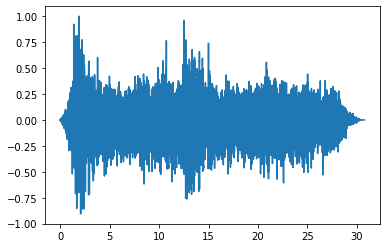

In [ ]:
Fs1, data1 = read('campfire.wav') # Campfire effect
data1 = data1[:,0] #waveform
Fs1 = Fs1 # framerate of the audio

write("campfire_manipulated.wav", int(Fs1), data1)

wave = thinkdsp.read_wave('campfire_manipulated.wav') # reading the audio file to be plotted
wave.plot()
plt.show()

IPython.display.Audio(data1, rate=Fs1 * 1.5) # displaying the playable audio

##Slowing down the Signal 

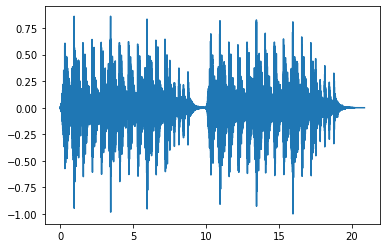

In [ ]:
Fs2, data2 = read('drum.wav') #Drum beat
data2 = data2[:,0]
Fs2 = Fs2

write("drum_manipulated.wav", int(Fs2), data2)

wave = thinkdsp.read_wave('drum_manipulated.wav')
wave.plot()
plt.show()

IPython.display.Audio(data2, rate=Fs2*.2)

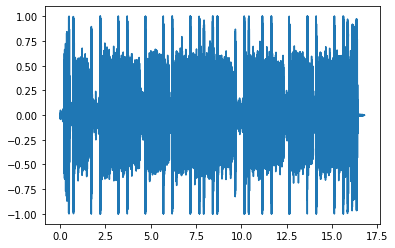

In [ ]:
Fs3, data3 = read('naruto.wav') # Naruto themed
data3 = data3[:,0]
Fs3 = Fs3

write("naruto_manipulated.wav", int(Fs3), data3)

wave = thinkdsp.read_wave('naruto_manipulated.wav')
wave.plot()
plt.show()

IPython.display.Audio(data3, rate=Fs3*.5)

## Signal Addition

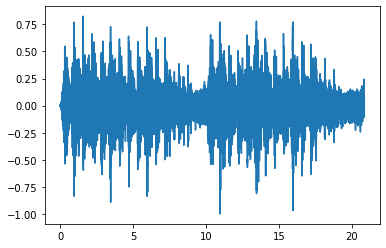

In [ ]:
Comb_data1 = data1[:920294] + data2[:920294] #Campfire and Drum beat

write("Comb_data1.wav", int(Fs1), Comb_data1)

wave = thinkdsp.read_wave('Comb_data1.wav')
wave.plot()
plt.show()

IPython.display.Audio(Comb_data1, rate=Fs1)

####You can notice here that the output audio file has a popping or crackling sound due to the high volume/signals that where produced by the naruto themed audio, and it is worsened by adding another audio signal

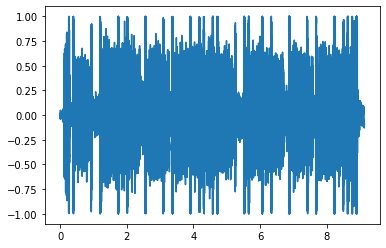

In [ ]:
Comb_data2 = data1[:402682] + data3[:402682] #Addition of Campfire and Naruto 

write("Comb_data2.wav", int(Fs1), Comb_data2) #Creating new WAV file based from the combined signals

wave = thinkdsp.read_wave('Comb_data2.wav')
wave.plot()
plt.show()

IPython.display.Audio(Comb_data2, rate=Fs1)

####Lowering the volume of naruto themed audio

In [ ]:
song = AudioSegment.from_wav("naruto.wav")

# reduce volume by 15 dB
song = song - 15

# Exporting to WAV file 
song.export("naruto_q.wav", "wav")

Fs4, data4 = read('naruto_q.wav') # Naruto themed but quieter
data4 = data4[:,0]
Fs4 = Fs4

####You can notice that the popping or crackling sound is already gone by reducing some decibel from the naruto themed audio

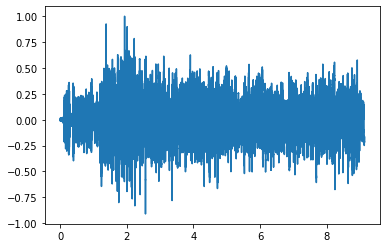

In [ ]:
Comb_data3 = data1[:402682] + data4[:402682] # Campfire and Naruto (quieter)

write("Comb_data3.wav", int(Fs1), Comb_data3)

wave = thinkdsp.read_wave('Comb_data3.wav')
wave.plot()
plt.show()

IPython.display.Audio(Comb_data3, rate=Fs1)

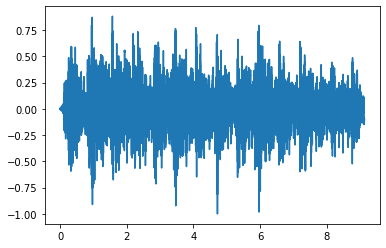

In [ ]:
Comb_data4 = data1[:402682] + data4[:402682] + data2[:402682] #Campfire, Drum Beat and Naruto (quieter)

write("Comb_data4.wav", int(Fs1), Comb_data4)

wave = thinkdsp.read_wave('Comb_data4.wav')
wave.plot()
plt.show()

IPython.display.Audio(Comb_data4, rate=Fs1)

## Signal Integration

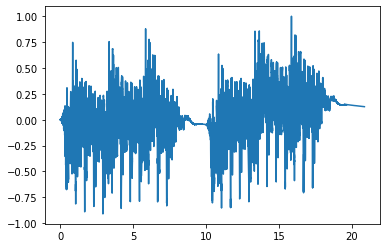

In [ ]:
Diff_data = integrate.cumulative_trapezoid(data2) # Performing Integration to Drum beat Audio
Diff_data = Diff_data.astype(np.int32) # Converting to int, to be able to create or convert into WAV file

write("Diff_data.wav", int(Fs2), Diff_data)

wave = thinkdsp.read_wave('Diff_data.wav')
wave.plot()
plt.show()

IPython.display.Audio(Diff_data, rate=Fs2)